# Promoting financial products to bank customers

## Problem statement: 
Predict the target customer for the marketing department to plan a strategy  

## Background
In 2016, a retail bank sold several products (mortgage account, savings account, and pension account) to its customers. It kept a record of all historical data, and this data is available for analysis and reuse. Following a merger in 2017, the bank has new customers and wants to launch some marketing campaigns.

The budget for the campaigns is limited. The bank wants to contact a customer and propose only one product

The marketing department needs to decide::
<ul>
    <li>Who should be contacted?</li>
    <li>Which one of the products should be proposed?</li>
    <li>Will such campaigns be profitable?</li> 
    
<ul>

##  Objective
Our assignment is to train a machine learning product-based classifier on customer profile to predict whether a customer would subscribe to a mortgage, savings, or pension account
 

<h4>Classification workflow</h4>
From the historical data, we can train machine learning product-based classification models on customer profile variables to predict which products are most likely to be bought by a particular customer, our main question we want to manswer is if a customer would subscribe to a <b> mortgage </b> , <b> savings</b>, or <b> pension</b> account product.

We can apply this classification model to new customer data to predict for each new customer which of the above products  would they subscribe to.
With this new data, you can decide which offers are proposed. Which product is offered to which customer.
The solutions can be displayed, compared, and analyzed.

<a id="contents"></a>
# Table of Contents
1. [import libraries for this project](#import_libraries)
2. [Data Cleaning and Formatting](#clean_data)
3. [Explanatory Data Analysis](#explore_data)
4. [Model Building](#model_data)
5. [Conclusion and Final Remarks](#conclusion_remarks)

To find row copy of the training dataset used for this project CLICK <a href="https://raw.githubusercontent.com/vberaudi/utwt/master/unknown_behaviors.csv">HERE</a>

To find row copy of the testing dataset used for this project CLICK <a href="https://raw.githubusercontent.com/vberaudi/utwt/master/unknown_behaviors.csv">HERE</a>

<a id="import_libraries"> </a>
## Import libraries for this project

In [1]:
#Importation of libraries 
%matplotlib inline 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.ensemble import GradientBoostingClassifier

<a id="clean_data"> </a>
## Data Cleaning and Formatting

In [2]:
#Data loading
pd.set_option('display.max_columns', 24)
data_2016= pd.read_csv("C:/Users/PROFFESSOR/Desktop/DATA ANALYTICS/DATASETS/Project Data Sets/data_2016.csv")

In [3]:
#checking for size of dataset
data_2016.shape 

(11023, 24)

<a id="explore_data"> </a>
## Explanatory Data Analysis

In [4]:
#looking at a snapshot of the data
data_2016.head()

,Unnamed: 0,customer_id,age,age_youngest_child,debt_equity,gender,bad_payment,gold_card,pension_plan,household_debt_to_equity_ratio,income,members_in_household,months_current_account,months_customer,call_center_contacts,loan_accounts,number_products,number_transactions,non_worker_percentage,white_collar_percentage,rfm_score,Mortgage,Pension,Savings
0,0,15,45,12,45,0,0,0,0,65,13453,2,33,36,0,4,2,1,14,19,7.602,0,0,0
1,1,16,43,12,43,0,0,0,0,65,13453,2,34,36,0,0,3,2,14,19,10.143,0,0,0
2,2,30,23,0,23,0,0,0,0,65,13453,2,30,36,0,1,0,0,14,19,0.000,0,0,0
3,3,42,35,8,35,1,0,0,0,65,13453,2,22,24,0,1,0,0,14,19,0.000,0,1,0
4,4,52,43,12,43,1,0,0,0,47,14124,3,40,48,3,1,0,0,16,35,0.000,0,1,0


In [5]:
#columns in the dataset
data_2016.columns

Index(['Unnamed: 0', 'customer_id', 'age', 'age_youngest_child', 'debt_equity',
       'gender', 'bad_payment', 'gold_card', 'pension_plan',
       'household_debt_to_equity_ratio', 'income', 'members_in_household',
       'months_current_account', 'months_customer', 'call_center_contacts',
       'loan_accounts', 'number_products', 'number_transactions',
       'non_worker_percentage', 'white_collar_percentage', 'rfm_score',
       'Mortgage', 'Pension', 'Savings'],
      dtype='object')

In [6]:
#lets drop the unnamed column since it's similar to the customer ID and we won't need it in our project.
data_2016.drop(columns=['Unnamed: 0'],inplace=True)

In [7]:
#lets make use of the pandas profiling report to make a quick analysis the data
from pandas_profiling import ProfileReport
profile = ProfileReport(data_2016, title="Pandas Profiling Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Lets Look at key takeways from the profiling report
  1. we have 15 numeric and 8 categorical variables making total of 23 variables
  2. 4.7 % of duplicate rows which we shall have to remove before we proceed with the analysis.
  3. There is no missing data.

In [8]:
#lets look at the duplicated rows
data_2016[data_2016.duplicated()]

,customer_id,age,age_youngest_child,debt_equity,gender,bad_payment,gold_card,pension_plan,household_debt_to_equity_ratio,income,members_in_household,months_current_account,months_customer,call_center_contacts,loan_accounts,number_products,number_transactions,non_worker_percentage,white_collar_percentage,rfm_score,Mortgage,Pension,Savings
7,74,31,0,31,1,0,0,0,50,14838,3,0,12,3,3,0,0,9,39,0.000,1,0,0
29,210,42,13,42,0,0,0,0,57,16959,2,40,48,2,2,3,2,9,33,9.571,0,0,0
89,53469,32,2,32,1,0,0,0,35,51862,5,41,48,5,1,3,2,14,49,10.122,0,0,1
135,53692,55,21,55,0,0,0,0,63,52185,3,-3,0,1,0,0,0,9,27,0.000,0,1,1
141,53714,38,6,38,1,0,0,0,43,52232,3,14,24,4,1,3,1,16,39,8.059,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10940,52684,36,2,36,1,0,0,0,57,51664,5,16,24,2,0,3,2,12,30,9.124,0,0,0
10943,52710,43,14,43,0,0,0,0,40,51704,4,31,36,5,0,3,2,9,49,11.191,0,0,1
10950,52733,37,12,37,0,0,0,0,67,51734,7,19,24,0,0,3,10,13,19,17.072,0,1,0
10999,53058,14,0,14,0,0,0,0,49,51777,7,29,36,3,1,2,2,14,36,11.418,0,0,0


In [9]:
#lets drop the duplicated rows
bank_data_2016=data_2016.drop_duplicates()

In [10]:
#new shape of data after dropping the duplicate rows
bank_data_2016.shape

(10498, 23)

In [11]:
#Getting some more details about the variables
bank_data_2016.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10498 entries, 0 to 11022
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   customer_id                     10498 non-null  int64  
 1   age                             10498 non-null  int64  
 2   age_youngest_child              10498 non-null  int64  
 3   debt_equity                     10498 non-null  int64  
 4   gender                          10498 non-null  int64  
 5   bad_payment                     10498 non-null  int64  
 6   gold_card                       10498 non-null  int64  
 7   pension_plan                    10498 non-null  int64  
 8   household_debt_to_equity_ratio  10498 non-null  int64  
 9   income                          10498 non-null  int64  
 10  members_in_household            10498 non-null  int64  
 11  months_current_account          10498 non-null  int64  
 12  months_customer                 

Since we are interested in predicting new customers who would buy certain products that is, mortgage, pension and savings, lets know how many customers bought each products in
2016.

In [12]:
def products_stat(df):
    mortgage_count = df[df.Mortgage == 1]
    pension_count = df[df.Pension == 1]
    savings_count = df[df.Savings == 1]
    total_customers = len(df)
    
    print("The Number of bank customers are: %d" %total_customers)
    print("The Number of bank customers who bought mortgage accounts are: %d" %len(mortgage_count))
    print("The Number of bank customers who bought pension accounts are: %d" %len(pension_count))
    print("The Number of bank customers who bought savings accounts are: %d \n" %len(savings_count))
    
    #compute thier percentages
    mortgage_percentage = len(mortgage_count) / total_customers * 100
    pension_percentage =  len(pension_count) / total_customers * 100
    savings_percentage =  len(savings_count) / total_customers * 100
    
    print("The Percentage of customers who bought mortgage accounts: %.2f%%" %mortgage_percentage)
    print("The Percentage of customers who bought pension accounts: %.2f%%" %pension_percentage)
    print("The Percentage of customers who bought savings accounts: %.2f%% \n" %savings_percentage)
    
    #compute overall summary statistics
    #create a column for number of products purchased
    df["num_products"] = df.Mortgage + df.Pension + df.Savings
    one_product = df[df.num_products == 1]
    print("You have %d customers who bought one product" %len(one_product))
    several_products =  df[df.num_products > 1]
    print("You have %d customers who bought several products" %len(several_products))
    
    # Calculate the percentage of customers who bought one and several products products
    one_product_percentage = len(one_product) / total_customers * 100
    several_products_percentage = len(several_products) / total_customers * 100
    # Print the results
    print("You have %d customers who bought one product, which is %.2f%% of the total" %(len(one_product), one_product_percentage))
    print("You have %d customers who bought several products, which is %.2f%% of the total" %(len(several_products), several_products_percentage))    

In [13]:
products_stat(bank_data_2016)

The Number of bank customers are: 10498
The Number of bank customers who bought mortgage accounts are: 1618
The Number of bank customers who bought pension accounts are: 2389
The Number of bank customers who bought savings accounts are: 4078 

The Percentage of customers who bought mortgage accounts: 15.41%
The Percentage of customers who bought pension accounts: 22.76%
The Percentage of customers who bought savings accounts: 38.85% 

You have 4730 customers who bought one product
You have 1616 customers who bought several products
You have 4730 customers who bought one product, which is 45.06% of the total
You have 1616 customers who bought several products, which is 15.39% of the total


### key takes ways from running the products_stat function  above
1. We can see that 38.85% of the customers bought the savings product.
2. The percentage of customers who bought the pension product is  22.76%. 
3. The least consumed product was mortgage accounts with 15.41%.
4. The highest number of customers bought one product with a percentage of 45.06%. 
5. The percentage of customers who bought several products are 15.39%.


Lets understand the behaviours of the customers with respect to the three products

In [14]:
#create a copy of the data.
bank_data1 = bank_data_2016.copy()

In [15]:
# lets create more informative gender column by replacing  values of 0 or 1 with male and female values.
#new_data['gender']= new_data['gender'].replace({1:'Male', 0:'Female'})
bank_data1['gender'].replace({1:'Male', 0:'Female'},inplace=True)

In [16]:
#In order to have more informative columns on whether a customer would take a certain bank product or not, 
#lets transform the encoded values of 0= 'No' and 1 = 'Yes'
#we shall also set these columns explicitylly as categorical columns since they have been encoded as intergers.
cat_cols = ['gender','bad_payment','gold_card','pension_plan','Mortgage','Pension','Savings']
cat_cols_transform = ['bad_payment','gold_card','pension_plan','Mortgage','Pension','Savings']
bank_data1[cat_cols_transform]=bank_data1[cat_cols_transform].astype('str')
# replace 0 and 1 values with NO and YES respectively
bank_data1[cat_cols_transform] =bank_data1[cat_cols_transform].replace({'0': 'NO', '1': 'YES'})

In [17]:
#code snippet
bank_data1.head()

,customer_id,age,age_youngest_child,debt_equity,gender,bad_payment,gold_card,pension_plan,household_debt_to_equity_ratio,income,members_in_household,months_current_account,months_customer,call_center_contacts,loan_accounts,number_products,number_transactions,non_worker_percentage,white_collar_percentage,rfm_score,Mortgage,Pension,Savings,num_products
0,15,45,12,45,Female,NO,NO,NO,65,13453,2,33,36,0,4,2,1,14,19,7.602,NO,NO,NO,0
1,16,43,12,43,Female,NO,NO,NO,65,13453,2,34,36,0,0,3,2,14,19,10.143,NO,NO,NO,0
2,30,23,0,23,Female,NO,NO,NO,65,13453,2,30,36,0,1,0,0,14,19,0.000,NO,NO,NO,0
3,42,35,8,35,Male,NO,NO,NO,65,13453,2,22,24,0,1,0,0,14,19,0.000,NO,YES,NO,1
4,52,43,12,43,Male,NO,NO,NO,47,14124,3,40,48,3,1,0,0,16,35,0.000,NO,YES,NO,1


In [18]:
#Obtain statistics on the data
bank_data1.describe()

,customer_id,age,age_youngest_child,debt_equity,household_debt_to_equity_ratio,income,members_in_household,months_current_account,months_customer,call_center_contacts,loan_accounts,number_products,number_transactions,non_worker_percentage,white_collar_percentage,rfm_score,num_products
count,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000,10498.000000
mean,34759.601353,39.422557,11.107068,39.422557,54.476472,42839.196323,4.298533,20.700038,27.469232,2.252334,1.114593,1.598685,1.957420,10.976091,33.050295,6.214844,0.770147
std,21914.786903,11.541697,10.190702,11.541697,9.643975,10429.175742,1.761701,13.356688,14.520433,1.570016,1.382023,1.773662,4.635581,3.824967,8.851562,7.210218,0.729250
min,15.000000,10.000000,0.000000,10.000000,10.000000,13453.000000,1.000000,-7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000
25%,17322.750000,32.000000,2.000000,32.000000,49.000000,35359.250000,3.000000,11.000000,24.000000,1.000000,0.000000,0.000000,0.000000,8.000000,27.000000,0.000000,0.000000
50%,33753.000000,39.000000,9.000000,39.000000,55.000000,42620.000000,4.000000,22.000000,24.000000,2.000000,1.000000,1.000000,1.000000,11.000000,33.000000,7.582000,1.000000
75%,49964.250000,46.000000,17.000000,46.000000,61.000000,50750.500000,6.000000,32.000000,36.000000,3.000000,2.000000,3.000000,2.000000,13.000000,39.000000,10.382000,1.000000
max,116993.000000,96.000000,66.000000,96.000000,83.000000,78675.000000,7.000000,41.000000,48.000000,10.000000,7.000000,6.000000,38.000000,37.000000,73.000000,45.268000,3.000000


### Key takeways are:

    1. The oldest customer age is 96 years and the youngest is 10 years of age
    2. Maximum income is 78675k and minumum income is about 13453k
    3. The average number of members in the customer households is 4 while the maximum number is 7 members.

In [19]:
#Perform univariate data visualization on some numeric columns, lets select the columns
num_cols=['age', 'age_youngest_child', 'debt_equity', 'household_debt_to_equity_ratio', 'income', 'members_in_household', 'months_current_account', 'months_customer','loan_accounts', 'number_products', 'number_transactions']

In [20]:
#use numercial columns to perform analysis
new_data1= bank_data1[num_cols]

In [21]:
data_subset_melt = pd.melt(new_data1)

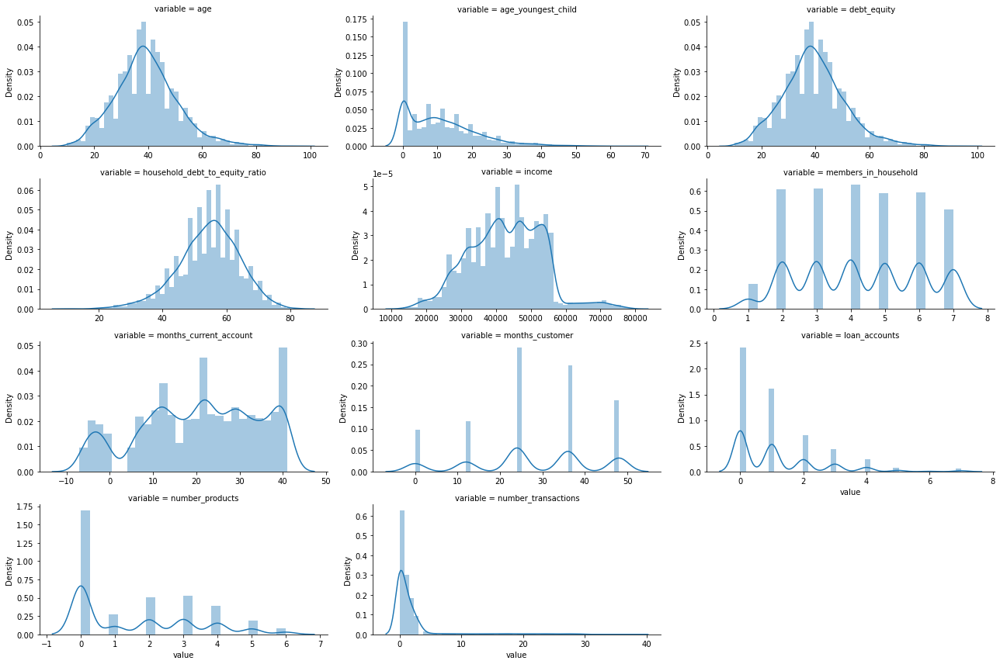

In [22]:
#%matplotlib inline 
#Visualise the data to see the distribution of individual columns
%matplotlib inline
g = sns.FacetGrid(data_subset_melt,aspect=2, col='variable', col_wrap=3, sharex=False, sharey=False)
g = g.map(sns.distplot, 'value')
plt.savefig('numerical_visuals.png')
plt.show()

### key takes ways from the plot above
1. We have some variables that are fairly normally distributed and those which are highly skewed.
2. Variables like age,income,debt_equity,household_debt_to_equity_ratio that are faily normally distributed
3. Variables like age_of_youngest_child,months_current_account are faiy skewed.
4. Variables such as number_of_products,number_of_transactions,loan_accounts,months_customer, members_in_household are highly skewed.


In [23]:
# select categorical columns
cat_cols = bank_data1.select_dtypes(include=['object']).columns
print(cat_cols)

Index(['gender', 'bad_payment', 'gold_card', 'pension_plan', 'Mortgage',
       'Pension', 'Savings'],
      dtype='object')


In [24]:
#subaset of dataframe to work with
new_data2=bank_data1[cat_cols]

In [25]:
#categorical dataframe
new_data2.head()

,gender,bad_payment,gold_card,pension_plan,Mortgage,Pension,Savings
0,Female,NO,NO,NO,NO,NO,NO
1,Female,NO,NO,NO,NO,NO,NO
2,Female,NO,NO,NO,NO,NO,NO
3,Male,NO,NO,NO,NO,YES,NO
4,Male,NO,NO,NO,NO,YES,NO


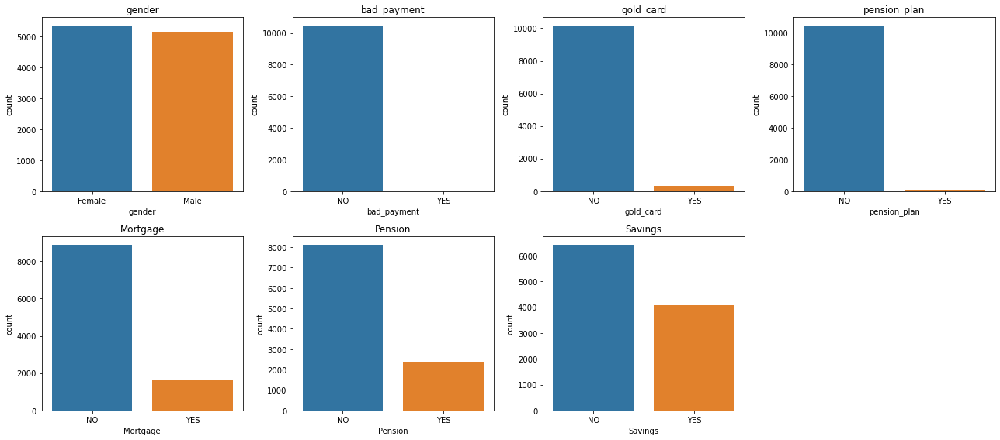

In [26]:
# Set the number of rows and columns for the subplot grid
num_rows = 2
num_cols = 4

# Create the subplot grid using matplotlib subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 8))
axes = axes.ravel()

# Loop through each column and create a countplot for each one
for i, col in enumerate(new_data2.columns):
    sns.countplot(x=col, data=new_data2, ax=axes[i])
    axes[i].set_title(col)
# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig('categorical_visuals.png')
plt.show()

### key takes ways from the plot above
1. Among the three products the bank is selling, the most consumed product is Savings, followed by Pension and the least is Mortgage.
2. There almost an equal number of males customers compared to female customers
3. There are negligible cases of badpayment from customers who consume loans
4. The gold card service is one which has not been taken up my majority of the customers.

<b> We are going to make our analysis involving the following variables: gender, age, age_youngest_child, income,members_in_household, Mortgage, Pension, Savings </b> 

### Lets Anaylize how some key Products interact with some variables

#### Bivariate Analysis

In [27]:
feature_cols= ['age','income','members_in_household','loan_accounts','Mortgage','Pension','Savings'] 

In [28]:
new_data4=bank_data1[feature_cols]

In [29]:
new_data4.head()

,age,income,members_in_household,loan_accounts,Mortgage,Pension,Savings
0,45,13453,2,4,NO,NO,NO
1,43,13453,2,0,NO,NO,NO
2,23,13453,2,1,NO,NO,NO
3,35,13453,2,1,NO,YES,NO
4,43,14124,3,1,NO,YES,NO


In [30]:
numeric_vars=['age','income','members_in_household','loan_accounts'] 

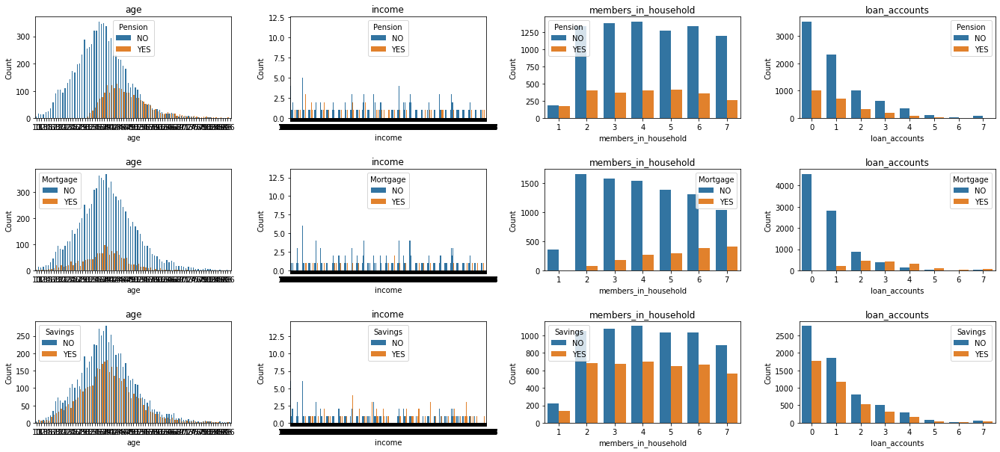

In [31]:
# Create a figure with 8 subplots
fig, axs = plt.subplots(3, 4, figsize=(23, 10))

# Iterate through each subplot and plot a countplot of each numeric variable
for i, binary_var in enumerate(['Pension', 'Mortgage','Savings']):
    for j, col in enumerate(numeric_vars):
        sns.countplot(x=col, hue=binary_var, data=new_data4, ax=axs[i,j])
        axs[i,j].set_title(col)
        axs[i,j].set_xlabel(col)
        axs[i,j].set_ylabel("Count")
        axs[i,j].tick_params(axis='both', which='major', labelsize=10)
        
# Add spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Show the plot
plt.savefig('bivariate_visuals.png')
plt.show()


### Multivariate Analysis

In [32]:
#lets select a set of  key columns  for further analysis 
new_cols= ['gender','age','age_youngest_child','members_in_household','income','Mortgage','Pension','Savings','loan_accounts']
new_data3= bank_data1[new_cols]

##### Qn.1 Does Gender have any correlation with other columns?

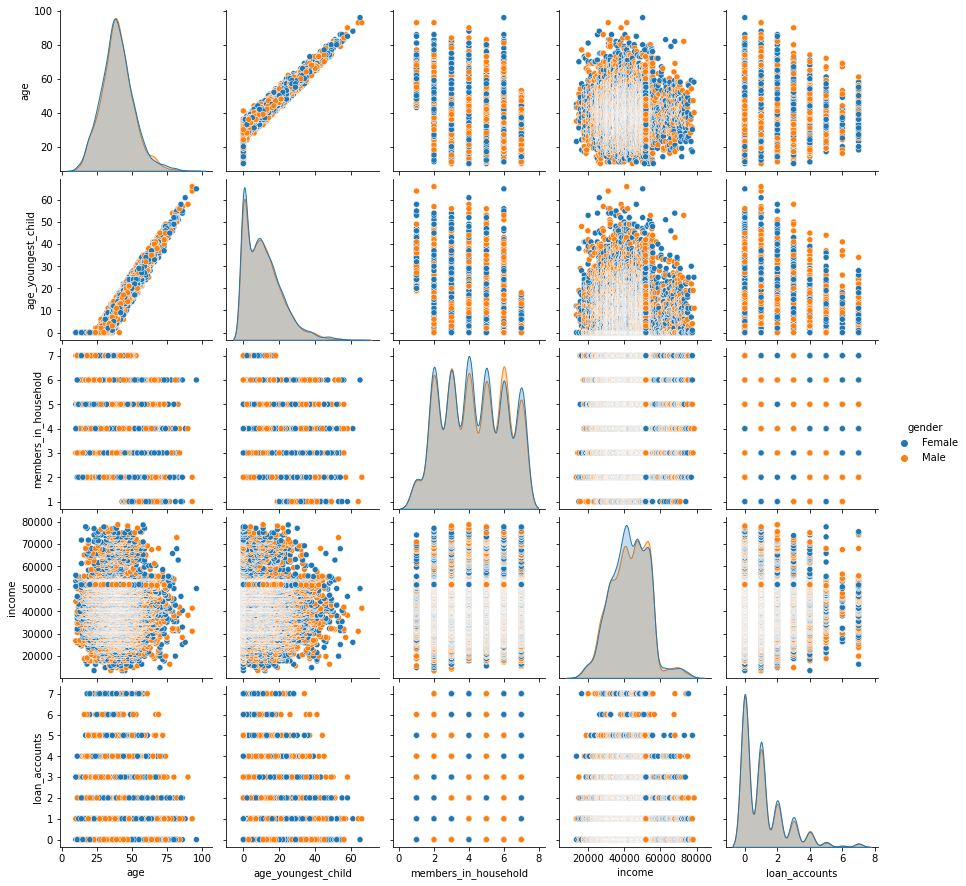

In [33]:
sns.pairplot(new_data3,hue='gender')

The only noticable relationship that we can see is between age and age of the youngest child columns that appear to have direct proportion to one another.
However there is no significant difference in the distribution of gender in these columns.

##### Qn.2 What is the distribution of Mortgage with other columns?

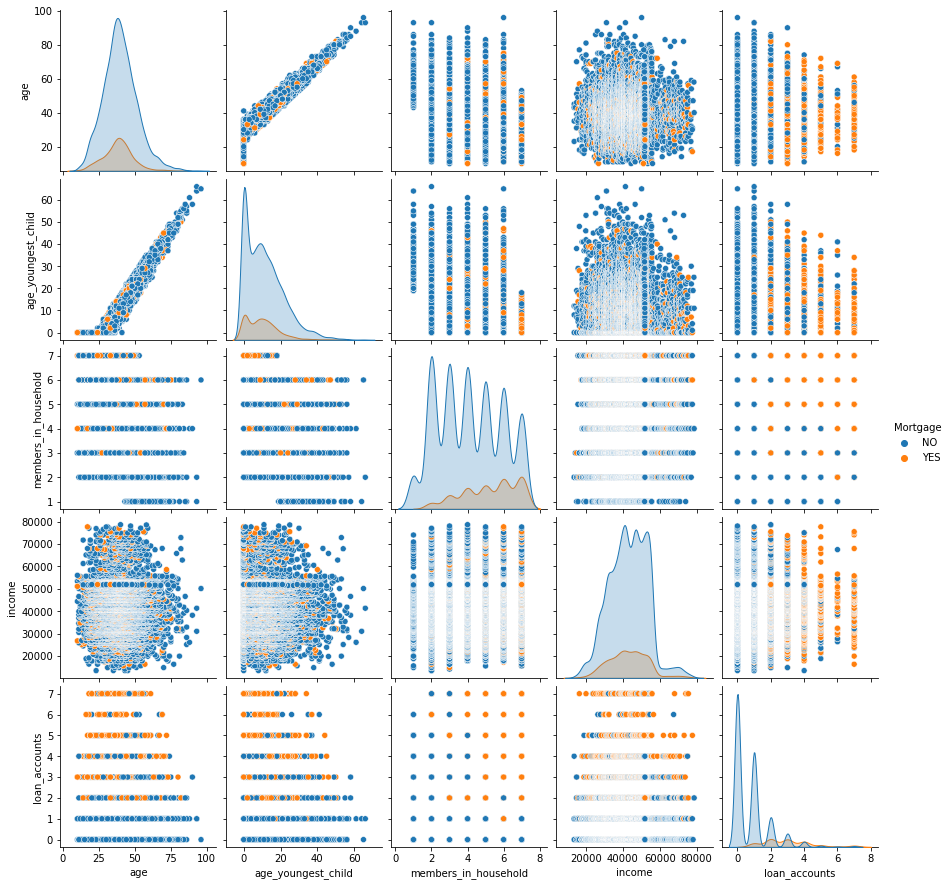

In [34]:
sns.pairplot(new_data3,hue='Mortgage')

We can see that betweeen age and age of the youngest child columns that appear to have direct linear proportion to one another,
the distribution of Mortgage is dense for those who do not buy the mortgage product 

##### Qn.3 What is the distribution of Pension with other columns?

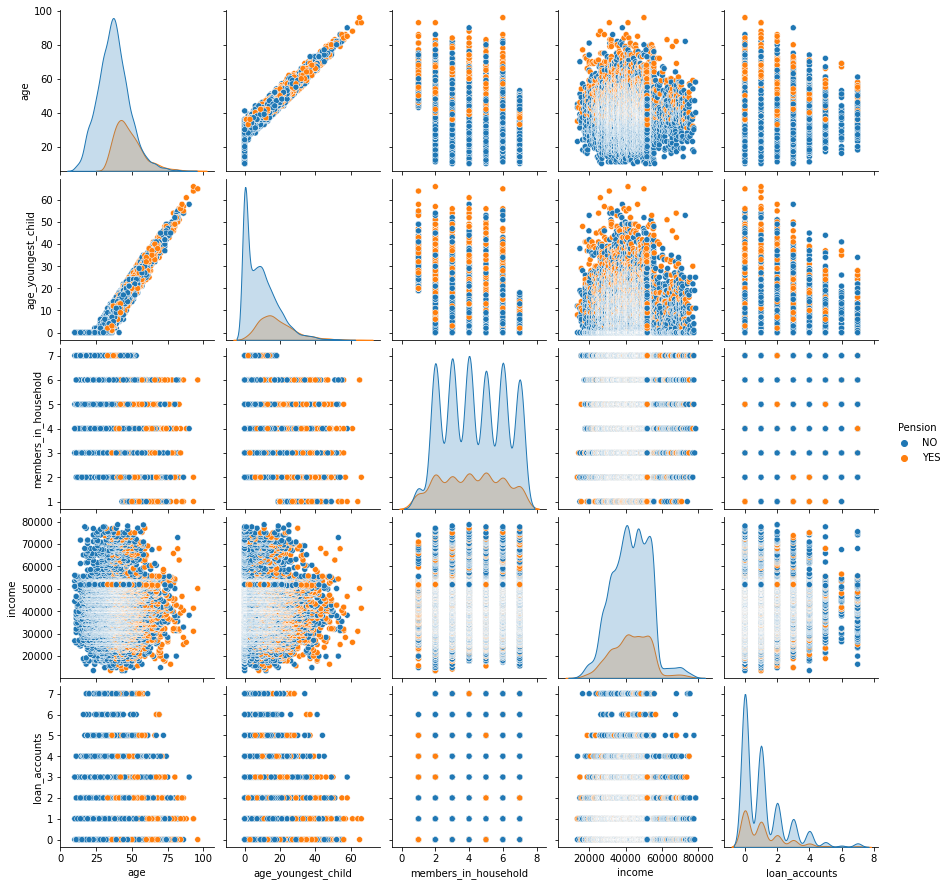

In [35]:
sns.pairplot(new_data3,hue='Pension')

We can see that there is no clear distiction of the dististribution pension as columns interact with one another but just like previous results,the distribution of pension becomes 
more dense for higher values of age and age of youngest child columns

##### Qn.4 What is the distribution of Savings with other columns?

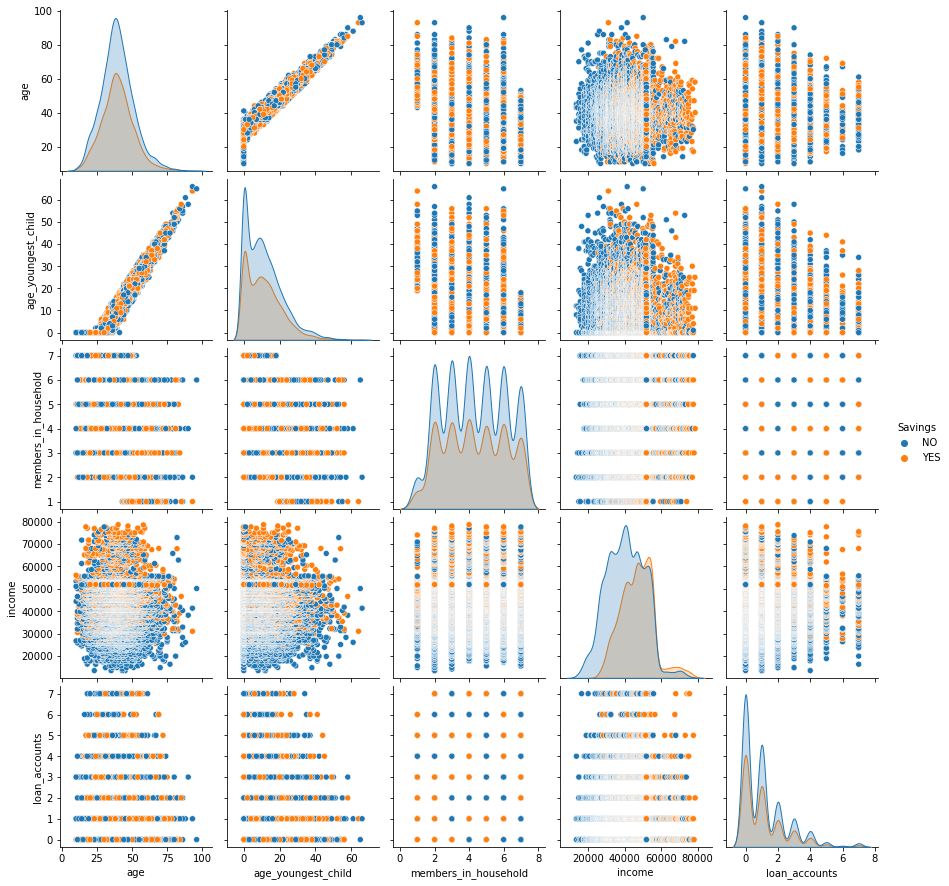

In [36]:
sns.pairplot(new_data3,hue='Savings')

We can also see  here that there is no clear distiction of the dististribution savings as columns interact with one another but we can notice that the distribution of those who 
bought savings product becomes more dense for lower values of age and age of youngest child columns. However the distribution of those who bought the savings product takes on higher values of income when plotted against age and also takes on  higher values of income when plotted against age of youngest child column.

In [37]:
#Which gender consumed Mortgage most
bank_data1.groupby(['gender','Mortgage']).customer_id.count()

gender  Mortgage
Female  NO          4467
        YES          877
Male    NO          4413
        YES          741
Name: customer_id, dtype: int64

In [38]:
#Which gender consumed Pension most
bank_data1.groupby(['gender','Pension']).customer_id.count()

gender  Pension
Female  NO         4135
        YES        1209
Male    NO         3974
        YES        1180
Name: customer_id, dtype: int64

In [39]:
#Which gender consumed Mortgage most
bank_data1.groupby(['gender','Savings']).customer_id.count()

gender  Savings
Female  NO         3265
        YES        2079
Male    NO         3155
        YES        1999
Name: customer_id, dtype: int64

In [40]:
#What is the average age and income of people who  bought the saving product
bank_data1.groupby(['Savings'],as_index=False)['age','income'].mean()

,Savings,age,income
0,NO,39.359346,40370.228660
1,YES,39.522070,46726.094899


In [41]:
#What is the average age and income of people who bought the saving product and the average age of their youngest child
bank_data1.groupby(['Savings'],as_index=False)['age','income','age_youngest_child'].mean()

,Savings,age,income,age_youngest_child
0,NO,39.359346,40370.228660,11.024299
1,YES,39.522070,46726.094899,11.237371


The result above shows us that a customers income plays a bigger role in determing whether he/she will buy a saving product. 
We see that the average, the customers who bought a savings product earned a higher income 6000+ compared to those who did not save

In [42]:
#What is the average age and income of people who abought the pension products
bank_data1.groupby(['Pension'],as_index=False)['age','income'].mean()

,Pension,age,income
0,NO,37.022691,42821.764213
1,YES,47.568439,42898.366262


The results above shows us that people who bought the pension product were approximately 10 years order than those who did not buy the product

In [43]:
#What is the average age and income of people who are bought the Mortgage product
bank_data1.groupby(['Mortgage'],as_index=False)['age','income'].mean()

,Mortgage,age,income
0,NO,39.646171,42854.226577
1,YES,38.195303,42756.706428


In [44]:
#What is the average age and income of people who are bought the Mortgage product and the average number of members in their houshold
bank_data1.groupby(['Mortgage'],as_index=False)['age','income','members_in_household'].mean()

,Mortgage,age,income,members_in_household
0,NO,39.646171,42854.226577,4.129505
1,YES,38.195303,42756.706428,5.226205


Customers who bought mortgage accounts had slightly more household members on average than those who did not buy the mortage accounts while other variables remained constant.

In [45]:
#What is the average age, income of people and the age of their yougest child who are bought the Mortgage product
bank_data1.groupby(['Mortgage'],as_index=False)['age','income','age_youngest_child'].mean()

,Mortgage,age,income,age_youngest_child
0,NO,39.646171,42854.226577,11.321171
1,YES,38.195303,42756.706428,9.932015


Here clients who are slightly younger on average and have younger child bought a mortgage product

In [46]:
#What is the average age, income of people and the age of their yougest child who  bought the Pension product
bank_data1.groupby(['Pension'],as_index=False)['age','income','age_youngest_child'].mean()

,Pension,age,income,age_youngest_child
0,NO,37.022691,42821.764213,9.052164
1,YES,47.568439,42898.366262,18.082043


Since the people who bought the pension brought were older on average by about 10 year compared to those who did not buy the pension product, the age of their yougest chil is also 9 years more than the age of the youngest child of those who did not buy the pension product

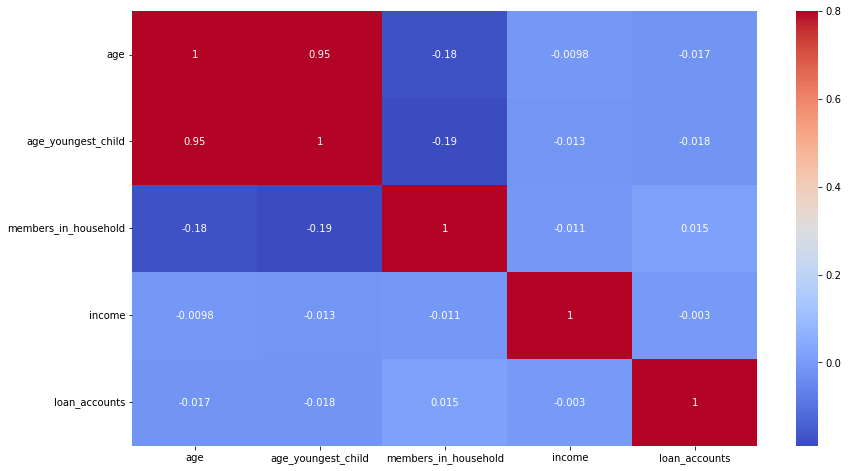

In [47]:
correlation_matrix = new_data3.corr()
fig = plt.figure(figsize=(14,8))
sns.heatmap(correlation_matrix,vmax=0.8,annot=True,cmap='coolwarm')
plt.savefig('correlation_visuals.png')
plt.show()

### key takes ways from the plot above
1. Age and income have a weak negative correlation however age appears to have a strong positive correlation with age_youngest_child 
2. There is a weak negative correlation between age and members in houshold variable
2. There is a negligible negative correlation between income and age as well as income and loan accounts.

<a id="model_data"> </a>
## Model  Building

### We are going to build multiple classifiers to predict which products a customer would buy.

In [48]:
#columns 
bank_data_2016.columns

Index(['customer_id', 'age', 'age_youngest_child', 'debt_equity', 'gender',
       'bad_payment', 'gold_card', 'pension_plan',
       'household_debt_to_equity_ratio', 'income', 'members_in_household',
       'months_current_account', 'months_customer', 'call_center_contacts',
       'loan_accounts', 'number_products', 'number_transactions',
       'non_worker_percentage', 'white_collar_percentage', 'rfm_score',
       'Mortgage', 'Pension', 'Savings', 'num_products'],
      dtype='object')

In [49]:
feature_cols= ['age','income','members_in_household','loan_accounts']

In [50]:
bank_products =['Mortgage','Pension','Savings'] 

In [51]:
x_features = bank_data_2016[feature_cols]
y_targets = [bank_data_2016[p] for p in bank_products]

In [52]:
x_features.head()

,age,income,members_in_household,loan_accounts
0,45,13453,2,4
1,43,13453,2,0
2,23,13453,2,1
3,35,13453,2,1
4,43,14124,3,1


In [53]:
# Building classifiers
classifiers = []
for i,p in enumerate(bank_products):
    clf = GradientBoostingClassifier()
    clf.fit(x_features, y_targets[i])
    classifiers.append(clf)

In [54]:
#We obtain three classifiers that are used in our prediction
print(classifiers)

[GradientBoostingClassifier(), GradientBoostingClassifier(), GradientBoostingClassifier()]


In [55]:
data_2017= pd.read_csv("C:/Users/PROFFESSOR/Desktop/DATA ANALYTICS/DATASETS/Project Data Sets/data_2017.csv")

In [56]:
data_2017.head()

,Unnamed: 0,customer_id,age,age_youngest_child,debt_equity,gender,bad_payment,gold_card,pension_plan,household_debt_to_equity_ratio,income,members_in_household,months_current_account,months_customer,call_center_contacts,loan_accounts,number_products,number_transactions,non_worker_percentage,white_collar_percentage,rfm_score
0,0,44256,38,11,38,1,0,0,0,58,47958.0,4,41,48,2,1,2,1,9,31,7.949
1,1,46883,30,1,30,0,0,0,0,55,48606.0,2,23,36,2,4,3,2,11,33,11.437
2,2,32387,41,13,41,1,0,0,0,59,42152.0,4,39,48,1,0,1,1,11,29,7.462
3,3,25504,42,14,42,1,0,0,0,57,39788.0,3,21,24,2,3,0,0,15,27,0.000
4,4,35979,42,14,42,1,0,0,0,53,44365.0,6,41,48,3,2,3,1,5,41,7.806


In [57]:
test_data = data_2017[feature_cols]

In [58]:
test_data.head()

,age,income,members_in_household,loan_accounts
0,38,47958.0,4,1
1,30,48606.0,2,4
2,41,42152.0,4,0
3,42,39788.0,3,3
4,42,44365.0,6,2


In [59]:
print("Number of new customers: %d" %len(data_2017))

Number of new customers: 2756


The given code makes predictions using multiple classifiers and then updates the test_data dataframe with the predicted values for each product, as well as adding a new column with customer IDs

In [60]:
predictions = [classifiers[i].predict(test_data) for i in range(len(bank_products))]
for i,p in enumerate(bank_products):
    test_data[p] = predictions[i]
test_data["id"] = data_2017["customer_id"]

In [61]:
# new test data dataframe with added new columns
test_data.head()

,age,income,members_in_household,loan_accounts,Mortgage,Pension,Savings,id
0,38,47958.0,4,1,0,0,0,44256
1,30,48606.0,2,4,0,0,0,46883
2,41,42152.0,4,0,0,0,0,32387
3,42,39788.0,3,3,0,0,0,25504
4,42,44365.0,6,2,1,0,0,35979


Since we are interested in predicting new customers who would buy certain products that is, mortgage, pension and savings, 

lets view some summary statistics on the 2017 new customer data after applying our model to the data.

In [62]:
products_stat(test_data)

The Number of bank customers are: 2756
The Number of bank customers who bought mortgage accounts are: 390
The Number of bank customers who bought pension accounts are: 143
The Number of bank customers who bought savings accounts are: 728 

The Percentage of customers who bought mortgage accounts: 14.15%
The Percentage of customers who bought pension accounts: 5.19%
The Percentage of customers who bought savings accounts: 26.42% 

You have 1040 customers who bought one product
You have 110 customers who bought several products
You have 1040 customers who bought one product, which is 37.74% of the total
You have 110 customers who bought several products, which is 3.99% of the total


### key takes ways from running the products_stat function  after applying our model on the test data
1. We can see that 26.42% of the new customers are predicted to buy the savings product
2. The percentage of customers predicted to buy the mortgage product is  14.15% 
3. The least consumed product was pension accounts with 5.19% of the bank customers
4. The highest number of customers bought one product with a percentage of 37.74%
5. The percentage of customers who bought several products are 3.99%

<a id="conclusion_remarks"> </a>
## Conclusion and Final Remarks

### Conclusion

1. We can see that just like in 2016, the best selling product is still the savings product and therefore more emphasis in form of marketing should be 
   put in selling this product to increase on the product uptake.
2. Unlike in 2016 where the least consumed product was mortgage, 2017 prediction results show that pension will be the least consumed product.
3. From the Prediction results, we also see that mortgage becomes the next consumed product after savings. 

### Final Remarks
Given more time, Since the constraint given was  to contact the customers to sell them only one product and you cannot select all of them,
We may need to explore the contact channel and their effectiveness to be able to select the best channel to use according to their profitability, 
and also select which product will be sold to a given customer.